In [1]:
import random
import numpy as np
import os
import glob
import cv2

In [2]:
def resize(path, img_height, img_width):
    img = cv2.imread(path)
    resized = cv2.resize(img, (img_height, img_width))
    return resized

In [3]:
def get_data():
    train_dir = "../data/train/"
    X_train = []
    y_train = []
    
    for j in range(10):
        print('Load folder c{}'.format(j))
        path = os.path.join(train_dir, 'c' + str(j), '*.jpg')
        files = glob.glob(path)
        for fl in files:
            flbase = os.path.basename(fl)
            img = resize(fl, 64, 64)
            X_train.append(img)
            y_train.append(j)
    return X_train, y_train

In [4]:
X_train, y = get_data()

Load folder c0
Load folder c1
Load folder c2
Load folder c3
Load folder c4
Load folder c5
Load folder c6
Load folder c7
Load folder c8
Load folder c9


In [5]:
X_train = np.asarray(X_train)
y = np.asarray(y)
print(X_train.shape)

(22424, 64, 64, 3)


In [6]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y, test_size=0.2, random_state=42)

In [7]:
X_train = np.reshape(X_train, (X_train.shape[0], -1))
X_val = np.reshape(X_val, (X_val.shape[0], -1))
print('Training data shape: ', X_train.shape)
print('Validation data shape: ', X_val.shape)

Training data shape:  (17939, 12288)
Validation data shape:  (4485, 12288)


In [8]:
from neural_net import TwoLayerNet
num_classes = 10
input_size = 64 * 64 * 3

results = {}
epoch = 2000
hidden = 100

net = TwoLayerNet(input_size, hidden, num_classes)
net.train(X_train, y_train,X_val,y_val, learning_rate = 1e-4, learning_rate_decay=0.9, reg=0.5, num_iters = epoch, verbose=False)
y_train_pred = net.predict(X_train)
y_val_pred = net.predict(X_val)
train_accuracy = np.mean(y_train == y_train_pred)
val_accuracy = np.mean(y_val == y_val_pred)

print('train accuracy: %f val accuracy: %f' % (train_accuracy, val_accuracy))

train accuracy: 0.933999 val accuracy: 0.928651


In [9]:
import collections
count_label = collections.Counter(y_val)
pred_label = collections.defaultdict(int)
wrong_label = collections.defaultdict(list)
for i in range(y_val.shape[0]):
    if y_val[i] == y_val_pred[i]:
        pred_label[y_val[i]]+=1
    else:
        wrong_label[y_val[i]].append(y_val_pred[i])
class_acc = collections.defaultdict(int)

for c in count_label:
    class_acc[c] = pred_label[c]/count_label[c]
print(class_acc)

defaultdict(<class 'int'>, {5: 0.9828326180257511, 7: 0.9655172413793104, 3: 0.9959266802443992, 6: 0.986870897155361, 8: 0.9025641025641026, 0: 0.8336933045356372, 9: 0.9139240506329114, 4: 0.871244635193133, 1: 0.95, 2: 0.88125})


In [32]:
map = {
    0: 'Safe driving', 
    1: 'Texting - right', 
    2: 'Talking on the phone - right', 
    3: 'Texting - left', 
    4: 'Talking on the phone - left', 
    5: 'Operating the radio', 
    6: 'Drinking', 
    7: 'Reaching behind', 
    8: 'Hair and makeup', 
    9: 'Talking to passenger'}

In [34]:
res={}

In [35]:
print("Class",":","Accuracy")
print()
for i in range(10):
    print(map[i],": ",class_acc[i])
    res[map[i]]=class_acc[i]

Class : Accuracy

Safe driving :  0.8336933045356372
Texting - right :  0.95
Talking on the phone - right :  0.88125
Texting - left :  0.9959266802443992
Talking on the phone - left :  0.871244635193133
Operating the radio :  0.9828326180257511
Drinking :  0.986870897155361
Reaching behind :  0.9655172413793104
Hair and makeup :  0.9025641025641026
Talking to passenger :  0.9139240506329114


In [36]:
print(res)

{'Safe driving': 0.8336933045356372, 'Texting - right': 0.95, 'Talking on the phone - right': 0.88125, 'Texting - left': 0.9959266802443992, 'Talking on the phone - left': 0.871244635193133, 'Operating the radio': 0.9828326180257511, 'Drinking': 0.986870897155361, 'Reaching behind': 0.9655172413793104, 'Hair and makeup': 0.9025641025641026, 'Talking to passenger': 0.9139240506329114}


In [49]:
import pandas as pd
new = pd.DataFrame.from_dict([res])
  
new

,Safe driving,Texting - right,Talking on the phone - right,Texting - left,Talking on the phone - left,Operating the radio,Drinking,Reaching behind,Hair and makeup,Talking to passenger
0,0.833693,0.95,0.88125,0.995927,0.871245,0.982833,0.986871,0.965517,0.902564,0.913924


In [27]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_val,y_val_pred)

In [29]:
print(cm)

[[386   8   1  27   1   4  17   0   2  17]
 [  0 475   1   1   0   1  18   1   0   3]
 [  0   6 423   2   0   0  42   2   5   0]
 [  0   0   0 489   0   0   2   0   0   0]
 [  0   0   0  40 406   1  13   0   2   4]
 [  1   0   0   2   0 458   2   0   0   3]
 [  0   1   0   0   1   0 451   1   2   1]
 [  0   0   0   0   0   1   6 364   5   1]
 [  1   1   0  12   4   0  12   3 352   5]
 [  1   1   0   3   0   0   4   0  25 361]]


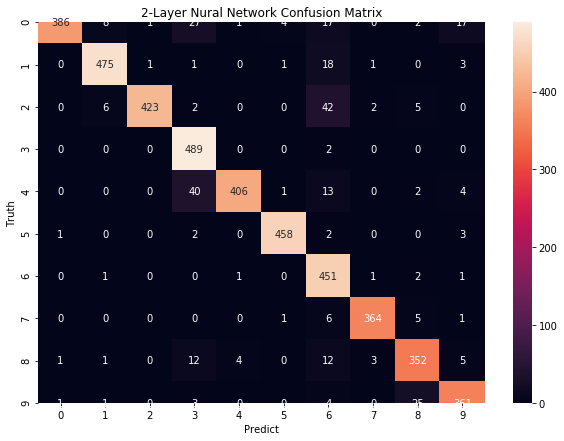

In [30]:
import seaborn as sn
import matplotlib.pyplot as plt
plt.figure(figsize=(10,7))
plt.title("2-Layer Nural Network Confusion Matrix")
sn.heatmap(cm,annot=True,fmt="d")
plt.xlabel("Predict")
plt.ylabel("Truth")
plt.show()

In [31]:
from sklearn import metrics
print("2-Layer Nural Network Performance Matrics")
print(metrics.classification_report(y_val, y_val_pred))

2-Layer Nural Network Performance Matrics
              precision    recall  f1-score   support

           0       0.99      0.83      0.91       463
           1       0.97      0.95      0.96       500
           2       1.00      0.88      0.93       480
           3       0.85      1.00      0.92       491
           4       0.99      0.87      0.92       466
           5       0.98      0.98      0.98       466
           6       0.80      0.99      0.88       457
           7       0.98      0.97      0.97       377
           8       0.90      0.90      0.90       390
           9       0.91      0.91      0.91       395

    accuracy                           0.93      4485
   macro avg       0.94      0.93      0.93      4485
weighted avg       0.94      0.93      0.93      4485



In [50]:
#Importing all necessary libraries
import cv2
import os
VX=[]  
# Read the video from specified path
cam = cv2.VideoCapture("./data/test.mp4")
  
try:
      
    # creating a folder named data
    if not os.path.exists('data'):
        os.makedirs('data')
  
# if not created then raise error
except OSError:
    print ('Error: Creating directory of data')
  
# frame
currentframe = 0
  
while(True):
      
    # reading from frame
    ret,frame = cam.read()
  
    if ret:
        # if video is still left continue creating images
        name = './data/test/frame' + str(currentframe) + '.jpg'
        #print ('Creating...' + name)
        #img = resize(frame, 64, 64)
        #img = cv2.resize(frame, (64, 64))
        #print(name.shape)
        #print(frame)
        #VX.append(img)
        # writing the extracted images
        cv2.imwrite(name, frame)
        # increasing counter so that it will
        # show how many frames are created
        currentframe += 1
    else:
        break
  
# Release all space and windows once done
cam.release()
cv2.destroyAllWindows()

In [51]:
def get_data():
    train_dir = "./data/test/"
    X = []
    path = os.path.join(train_dir,'*.jpg')
    files = glob.glob(path)
    for fl in files:
        flbase = os.path.basename(fl)
        img = resize(fl, 64, 64)
        X.append(img)
    return X

In [52]:
test= get_data()

In [53]:
#converted images into numpy array
test = np.asarray(test)
print(test.shape)

(467, 64, 64, 3)


In [71]:
testV = np.reshape(test, (test.shape[0], -1))

In [72]:
np.random.shuffle(testV)

In [73]:
print(testV.shape)

(467, 12288)


In [74]:
test_pred = net.predict(testV)

In [75]:
print(test_pred)

[5 3 7 8 5 8 3 8 6 1 3 7 4 8 8 8 4 1 8 1 4 3 6 7 3 6 7 8 1 6 8 6 7 8 3 8 8
 8 5 8 7 7 8 8 5 4 8 5 8 4 5 8 8 0 8 6 3 8 4 8 3 6 6 1 8 3 1 8 7 0 8 7 8 8
 8 4 3 6 4 3 9 1 1 1 8 0 4 8 8 8 6 6 6 8 8 5 8 7 3 8 7 0 6 1 8 8 7 7 8 1 6
 8 7 7 3 3 8 3 6 7 0 6 8 6 6 8 8 7 8 3 8 7 4 8 8 6 8 3 8 6 8 3 8 4 8 8 3 6
 3 4 8 8 7 4 1 6 6 8 6 7 7 8 3 8 3 0 3 7 3 6 8 8 8 5 0 8 5 4 8 1 8 3 3 8 1
 6 3 7 7 8 1 0 8 8 0 8 6 8 8 1 3 6 3 4 0 7 3 9 7 4 1 8 5 1 8 8 3 8 3 6 4 7
 8 8 8 5 8 8 6 3 8 6 8 8 6 8 1 6 8 8 8 8 7 8 5 4 3 4 8 5 1 0 4 6 1 3 8 9 8
 7 7 4 8 3 5 8 8 6 8 7 3 3 8 6 8 6 8 1 8 8 8 4 8 8 1 1 8 7 4 7 6 3 8 4 8 6
 3 3 8 8 1 3 8 3 8 8 8 8 7 1 1 8 9 1 8 6 8 3 3 4 6 8 7 7 8 8 7 8 1 6 3 3 8
 8 8 7 7 8 3 1 3 8 8 8 8 8 8 4 8 8 0 5 7 8 8 4 5 8 1 3 7 1 3 8 8 8 8 8 8 7
 8 6 8 5 5 4 8 8 0 3 6 6 0 3 6 7 3 8 6 8 4 6 8 5 7 8 8 8 3 7 7 0 3 8 6 4 3
 8 8 8 7 1 8 6 6 8 7 8 8 6 0 7 7 8 8 7 8 8 7 7 3 8 7 8 8 9 8 6 8 8 8 4 7 6
 8 4 7 8 5 1 7 8 8 8 6 7 8 8 1 8 3 8 7 1 6 7 3]


In [76]:
map = {
                0: 'Safe driving', 
                1: 'Texting - right', 
                2: 'Talking on the phone - right', 
                3: 'Texting - left', 
                4: 'Talking on the phone - left', 
                5: 'Operating the radio', 
                6: 'Drinking', 
                7: 'Reaching behind', 
                8: 'Hair and makeup', 
                9: 'Talking to passenger'}

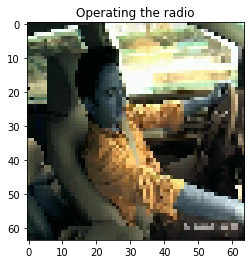

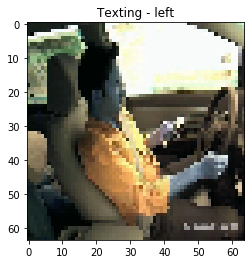

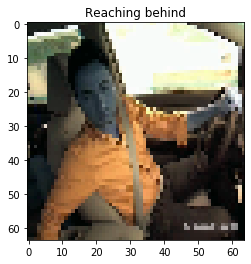

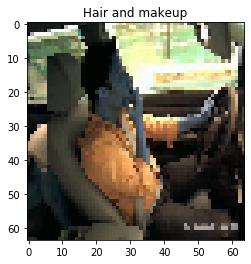

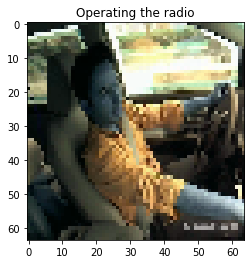

...

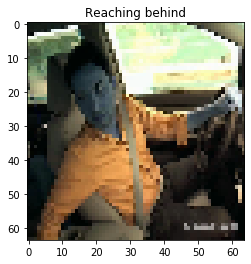

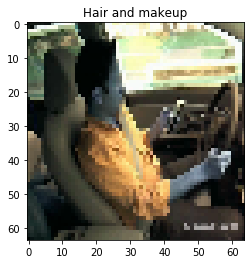

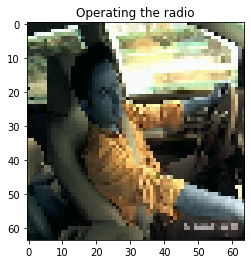

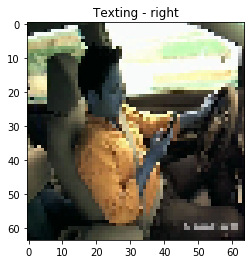

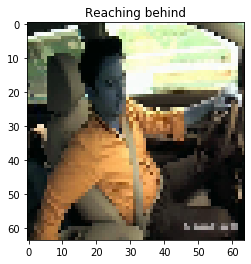

In [77]:
for i in range(451):
    #f, axarr = plt.subplots(5,5)
    #axarr[0,0].imshow(test[i])
    #axarr[0,1].imshow(image_datas[1])
    #axarr[1,0].imshow(image_datas[2])
    #axarr[1,1].imshow(image_datas[3])
    plt.imshow(test[i])
    plt.title(map[test_pred[i]])
    plt.show()